# Evaluation of the traffic light detection model - real images
This notebook is derived from the tutorial of Object Detection API. This notebook assumes the the test images are stored locally in TEST_IMAGE_PATH directory (defined below). These images can be downloaded from [here](https://www.dropbox.com/s/s28zz6ia9kafesw/images_ros_all.record?dl=0).

In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import glob

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

%matplotlib inline

## Environment setup
Change the variables below to run the notebook in your environent

In [2]:
# set up path to object detection libraries
OBJECT_DETECTION_API_PATH='/datadrive/models/research/object_detection'
sys.path.append(OBJECT_DETECTION_API_PATH)
sys.path.append(OBJECT_DETECTION_API_PATH+'/..')

# What model to download
MODEL_DIR = '/datadrive/traffic_light_detector'
MODEL_NAME = 'fine_tuned_model_real_out'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_DIR + '/' + MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join(MODEL_DIR + '/data', 
                              'label_mapping_lowercase.pbtxt')

# path to test images
TEST_IMAGE_PATH = '/datadrive/data/images_ros'

## Test labels

In [3]:
labels = np.empty(2030,dtype='str')
labels[0:36] = 'red'
labels[36:157] = 'green'
labels[157:234] = 'nothing'
labels[234:346] = 'red'
labels[346:471] = 'green'
labels[471:533] = 'yellow'
labels[533:657] = 'red'
labels[657:733] = 'green'
labels[733:805] = 'nothing'
labels[805:843] = 'yellow'
labels[843:967] = 'red'
labels[967:1092] = 'green'
labels[1092:1153] = 'yellow'
labels[1153:1278] = 'red'
labels[1278:1402] = 'green'
labels[1402:1464] = 'yellow'
labels[1464:1586] = 'red'
labels[1586:1607] = 'nothing'
labels[1607:1713] = 'green'
labels[1713:1775] = 'yellow'
labels[1775:1899] = 'red'
labels[1899:1903] = 'green'
labels[1903:2030] = 'nothing'

## Object detection imports

In [4]:
from utils import label_map_util
from utils import visualization_utils as vis_util

# Model preparation 

## Load a (frozen) Tensorflow model into memory.

In [5]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [6]:
# Number of classes detected by model
NUM_CLASSES = 3

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

# redefine label_map to be used in evaluation of model accuracy
label_map = {}
for item in category_index.values():
    label_map[item['id']] = item['name'][0].lower()

## Helper code

In [7]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

## Computation of detection and classification losses

In [8]:
def loss(id, label):
    '''
    id - id of image
    label - predicted label
    '''
    if labels[id] == label or (labels[id] == 'n' and label == 'g'): 
        # correct prediction or detection of green light when there is no visible traffic light
        return 0, 0
    elif labels[id] == 'n' or label == 'n':
        # there was no visible light, but the model detected a light, 
        # or there was a visible light, but the model didn't detect it 
        return 1, 0
    else:
        # the model detected the light, but labeled it with wrong color
        return 0, 1 

# Detection

/anaconda/envs/py35/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


detection loss = 11  classification loss = 8


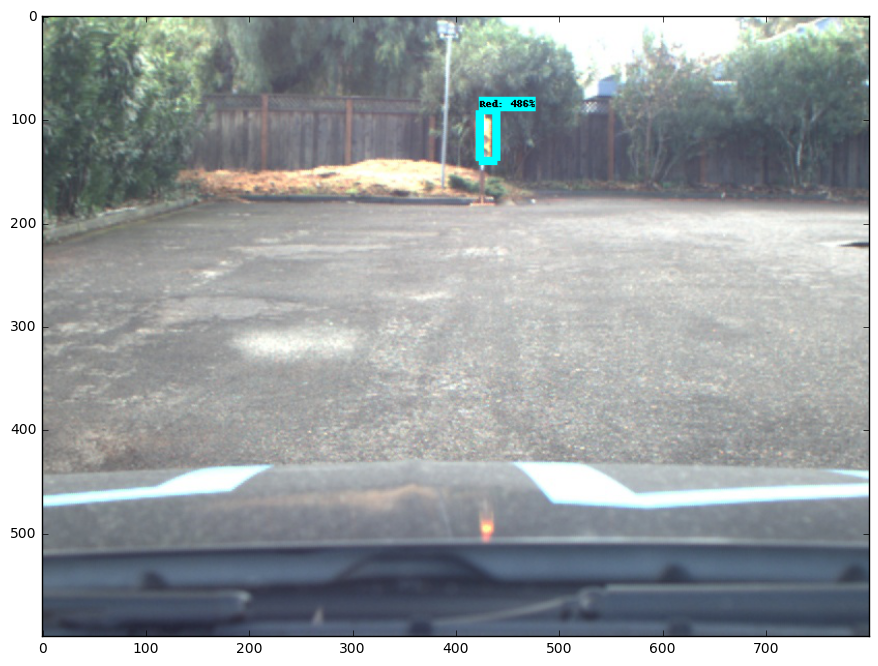

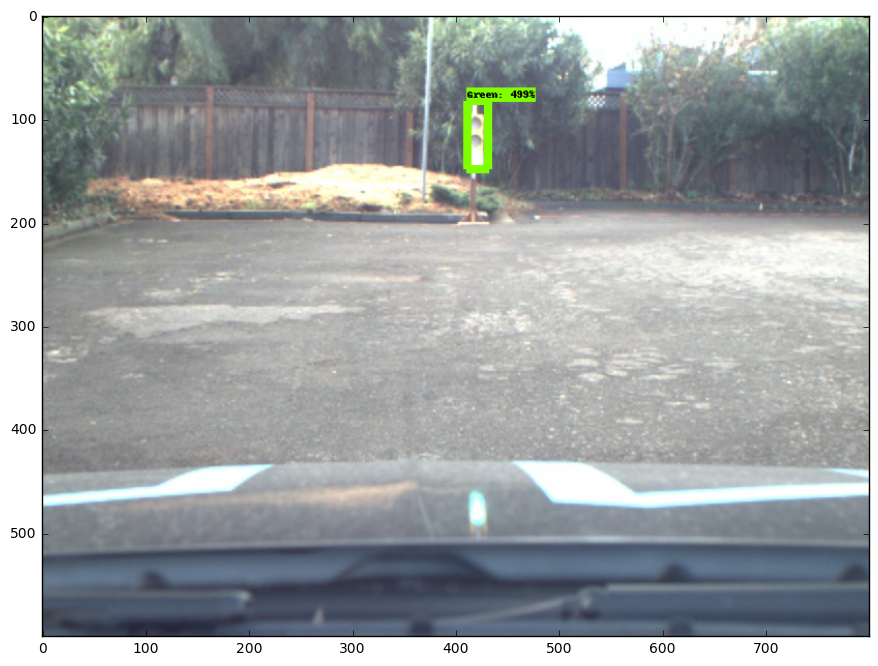

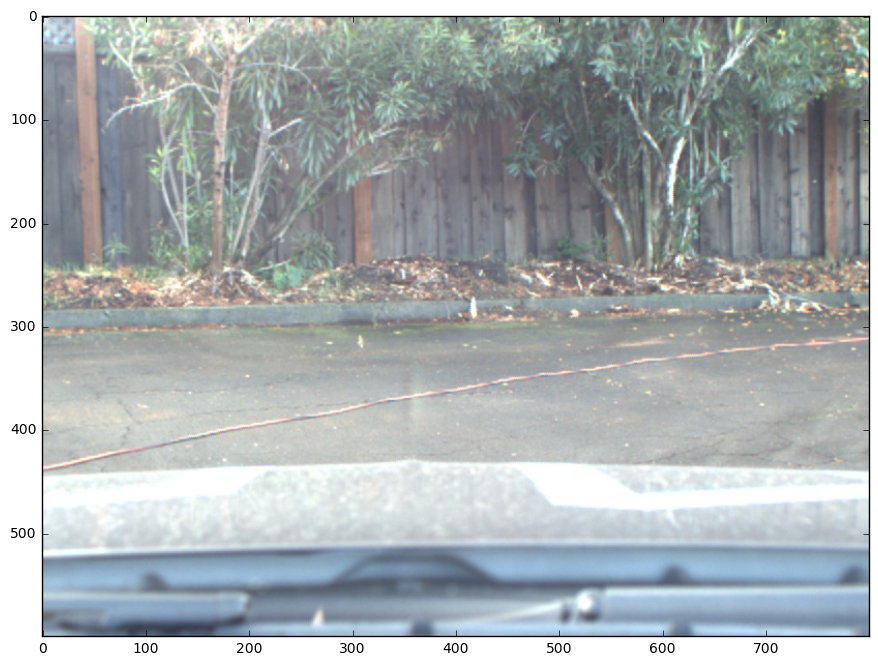

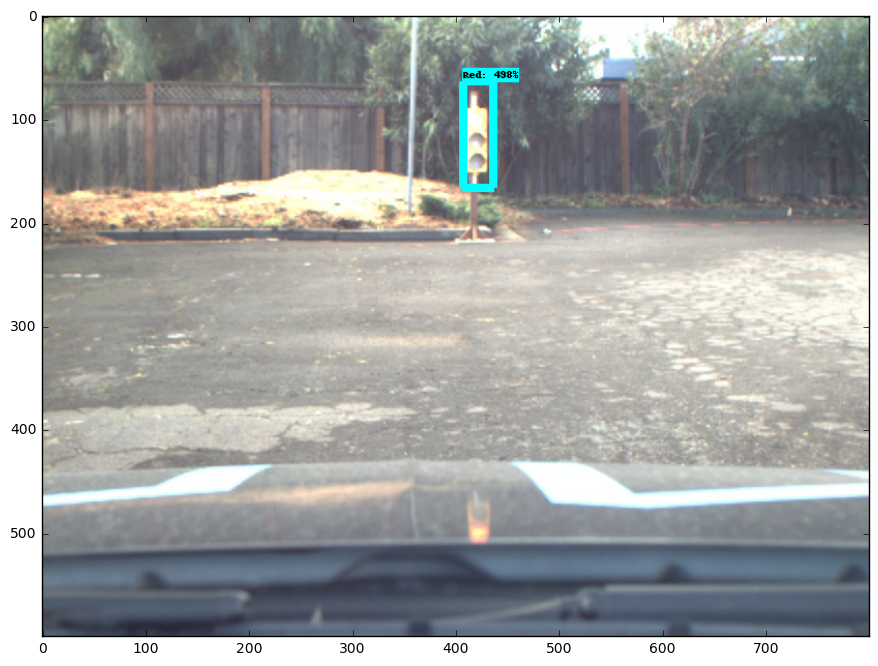

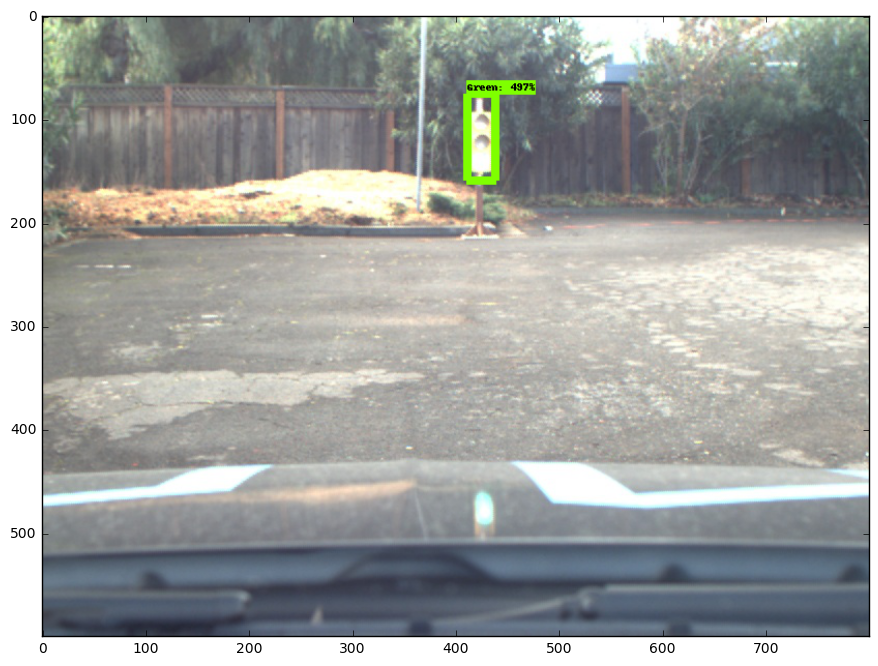

...

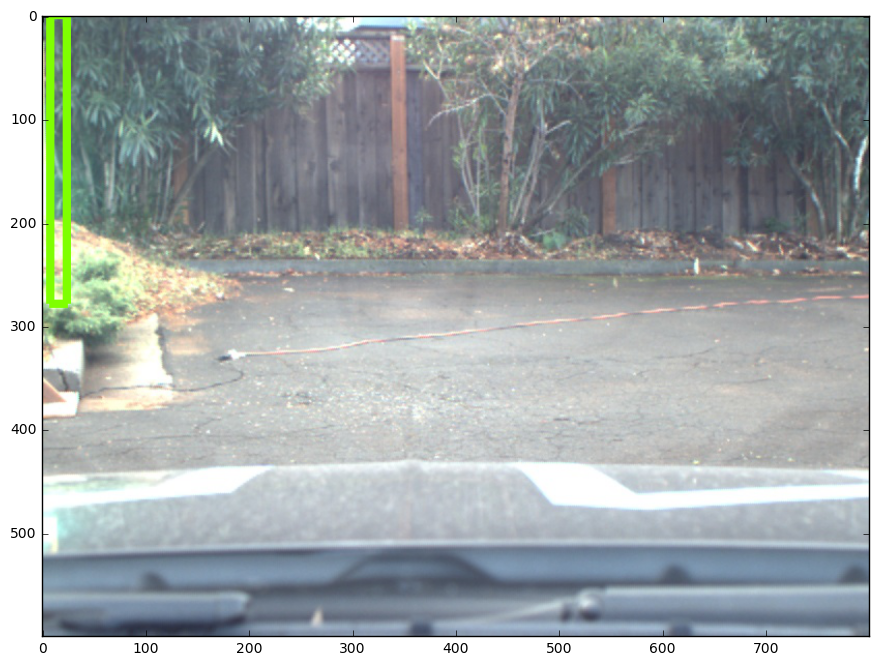

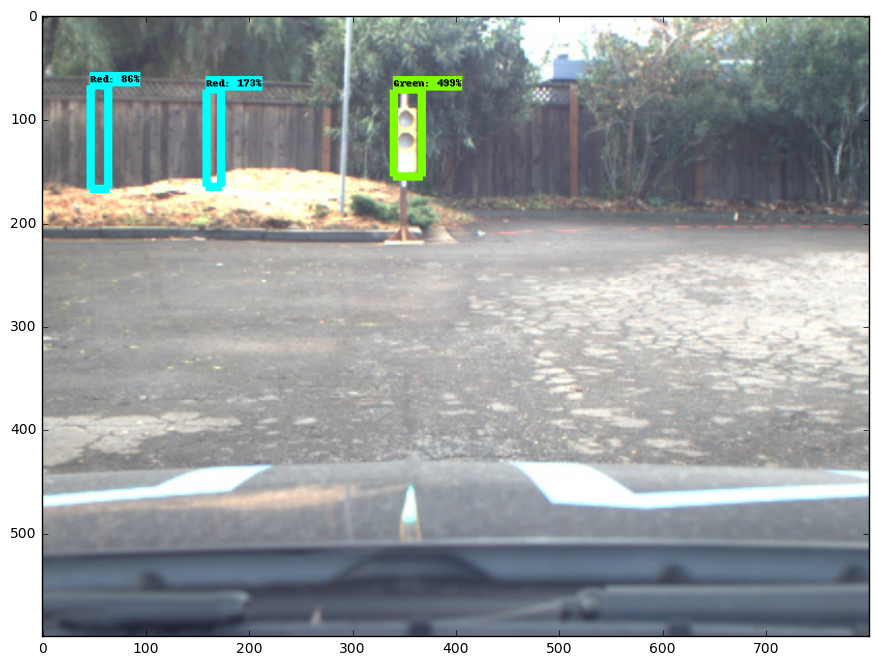

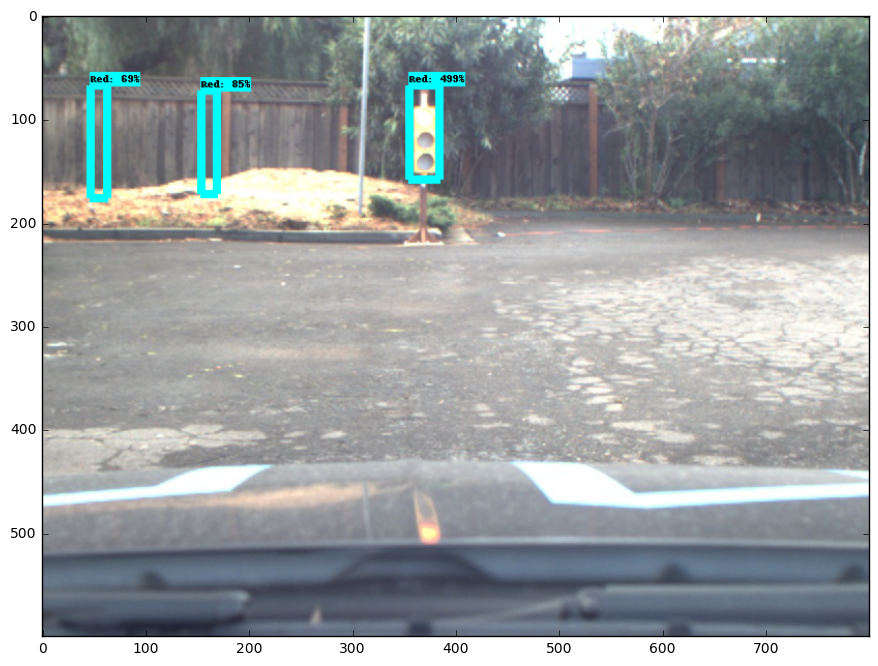

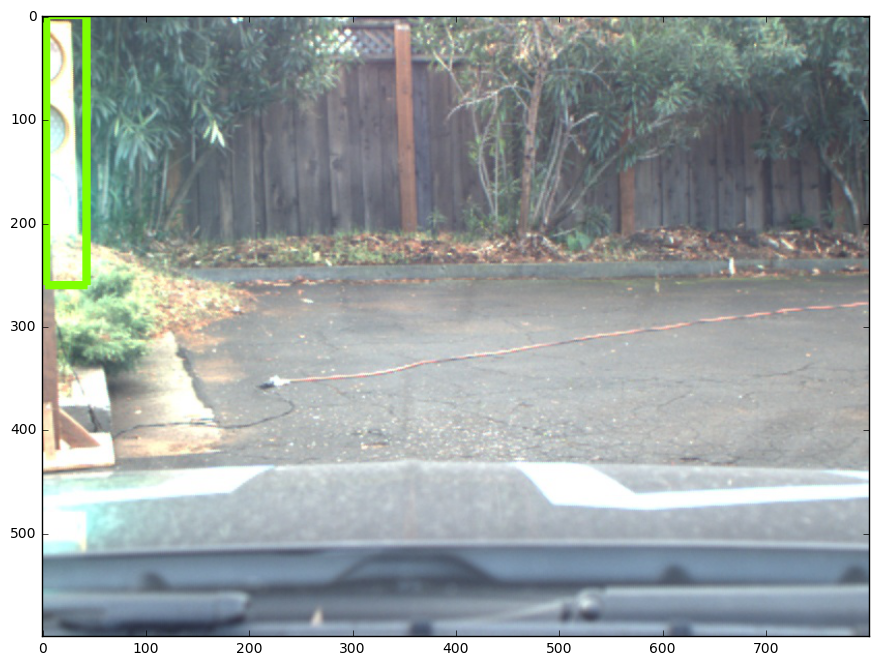

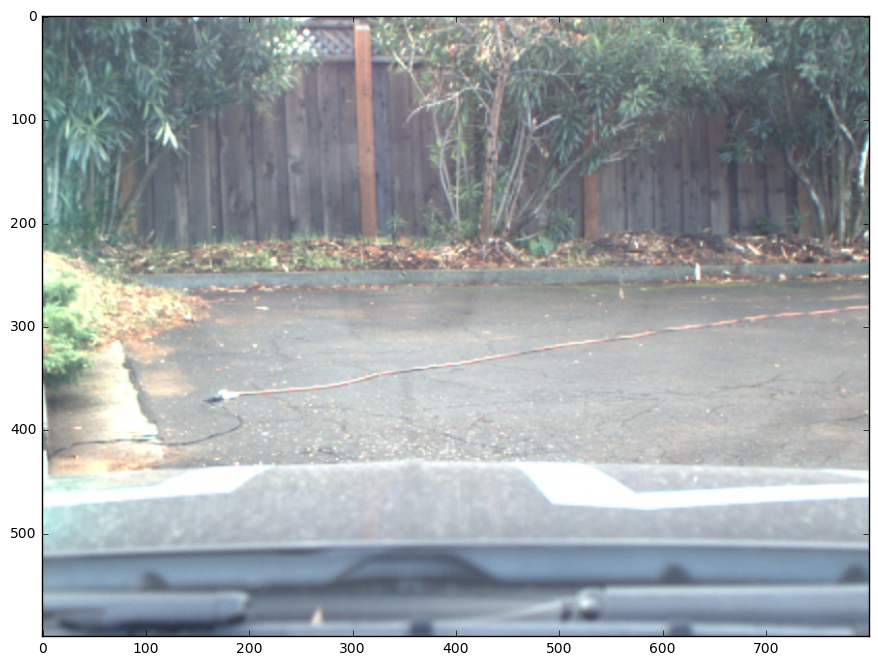

In [9]:
# Size, in inches, of the output images
IMAGE_SIZE = (12, 8)

n_test_images = len(glob.glob(TEST_IMAGE_PATH+'/*jpg'))
total_detection_loss = 0
total_classification_loss = 0

with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    # Definite input and output Tensors for detection_graph
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    
    # Each box represents a part of the image where a particular object was detected.
    detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    
    # Each score represent how level of confidence for each of the objects.
    # Score is shown on the result image, together with the class label.
    detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
    detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    
    # run model over all images in test  directory
    for image_id in range(n_test_images):
      image_path = TEST_IMAGE_PATH + '/left' + str(image_id).zfill(4) + '.jpg'
      image = Image.open(image_path)
      
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      image_np = load_image_into_numpy_array(image)
    
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
    
      # Actual detection.
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
    
      # We look at the box with the highest score and classify the image accordingly.
      # The detections are counted if score >= 0.1
      if scores[0][0] < 0.1:
          label = 'n'
      else:
          label = label_map[int(classes[0][0])]
             
      # compute detection and classification losses           
      detection_loss, classification_loss = loss(image_id, label)
        
      # update total detection and classification losses  
      total_detection_loss += detection_loss
      total_classification_loss += classification_loss  
        
      # Visualization of the results of a detection.
      if image_id % 100 == 0:
          scores = scores * 5   # multiplication by 5 is because we use detection threshold=0.1 and visualization function 
                                # shows only detection with scores larger than 0.5 
          vis_util.visualize_boxes_and_labels_on_image_array(
              image_np,
              np.squeeze(boxes),
              np.squeeze(classes).astype(np.int32),
              np.squeeze(scores),
              category_index,
              use_normalized_coordinates=True,
              line_thickness=8)
          plt.figure(figsize=IMAGE_SIZE)
          plt.imshow(image_np)
            
print("detection loss =", total_detection_loss, " classification loss =", total_classification_loss)

The model detected correctly all traffic lights. There were a few false detections. In image #17 the model detected green light when there is no visible light. Even if detection is wrong, the car still will drive correcty. In all other false detections their scores were not the largest ones, and hence they are ignored by traffic light detection system. 